# Predictive Maintenance Model for the NASA Turbofan Engine Challenge.


The goal here is develop a predictive maintenance model that forecasts the RUL (Remaining Useful Life) of an engine to help optimize maintenace strategies. 3 datasets are provided, training, test & RUL datasets. The training set contains 100 engines (same type & settings) which ran till failure. The test set contains 100 engines ran to somepoint before failure and the RUL set contains the actual RUL values of the test set when it finally reached failure.

Goal: Predict the RUL values for each engine in the test set using a model trained on the training set and compare the predicted RUL values against the actual RUL values from the RUL set.

This Predictive Maintenance Model was developed using a regressive approach with time series features introduced to it. This is to maintain the time-series methodology without using a complicated Neural Network such as CNNs or LSTMs. A traditional time-series model such as an ARIMA/SARIMA/SVARMA/SARIMAX model is not ideal here due to the inconsistent engine lifecycle/RUL values. Therefore a more robust approach was required in order to maintain the simplicity of an ML model while also accounting for the trend changes over an engine's lifecycle.

In [45]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from sklearn.preprocessing import PolynomialFeatures, StandardScaler, MinMaxScaler, FunctionTransformer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, root_mean_squared_error, r2_score, mean_absolute_percentage_error
from sklearn.model_selection import GridSearchCV, GroupKFold

Import Files using the readFile function. The dataframes, dftr & dfts, are copied into the variables dftrain & dftest respectively which will be used throughout the notebook. This was done to preserve an original version of the data (without preprocessing) incase it was ever required.

In [46]:
col_names = ['Engine', 'Cycles', 'OpSet_1', 'OpSet_2', 'OpSet_3']
col_names.extend(f'Sensor_{x}' for x in range (1,22))

def readFile (filename, columns):
    print(f'Reading data from {filename}...')
    return pd.read_csv(filename, sep=' ', header=None).dropna(axis=1).set_axis(columns, axis=1)

dftr = readFile('train_FD001.txt', col_names)
dfts = readFile('test_FD001.txt', col_names)
dfr = readFile('RUL_FD001.txt', ['RUL'])

dftrain = dftr.copy()
dftest = dfts.copy()

Reading data from train_FD001.txt...
Reading data from test_FD001.txt...
Reading data from RUL_FD001.txt...


Check for variance & no. of unique values. This was done to identify any static columns within the dataframe with the idea being that their variances would equate to 0 & their unique value count would equate to 1.

In [47]:
sensors = [col for col in dftrain.columns if col not in ['Engine', 'Cycles']]
for sensor in sensors:
    print(f'{sensor}:\tVariance: {dftrain[sensor].var()} , Unique Count: {dftrain[sensor].nunique()}\t\t|\t\tVariance: {dftest[sensor].var()} , Unique Count: {dftest[sensor].nunique()}')

OpSet_1:	Variance: 4.784340124242533e-06 , Unique Count: 158		|		Variance: 4.851821565212443e-06 , Unique Count: 150
OpSet_2:	Variance: 8.588540885522267e-08 , Unique Count: 13		|		Variance: 8.645397438669485e-08 , Unique Count: 14
OpSet_3:	Variance: 0.0 , Unique Count: 1		|		Variance: 0.0 , Unique Count: 1
Sensor_1:	Variance: 0.0 , Unique Count: 1		|		Variance: 0.0 , Unique Count: 1
Sensor_2:	Variance: 0.2500532728983226 , Unique Count: 310		|		Variance: 0.1607202824753694 , Unique Count: 262
Sensor_3:	Variance: 37.59099443280496 , Unique Count: 3012		|		Variance: 25.03275001979333 , Unique Count: 2361
Sensor_4:	Variance: 81.01088641554637 , Unique Count: 4051		|		Variance: 44.733481197738996 , Unique Count: 2954
Sensor_5:	Variance: 3.15559657501012e-30 , Unique Count: 1		|		Variance: 3.1556845864144696e-30 , Unique Count: 1
Sensor_6:	Variance: 1.929279087728537e-06 , Unique Count: 2		|		Variance: 2.903904855802131e-06 , Unique Count: 2
Sensor_7:	Variance: 0.7833883045757074 , Unique 

This global representation plot is meant to identify the trend of a sensor throughout the lifecycle of an engine for all engines. As we can see, in this example of *Sensor_9*, its trend overtime is not common across all engines. Change the *col* value with the name of a column in the dataframe to observe its trend overtime.

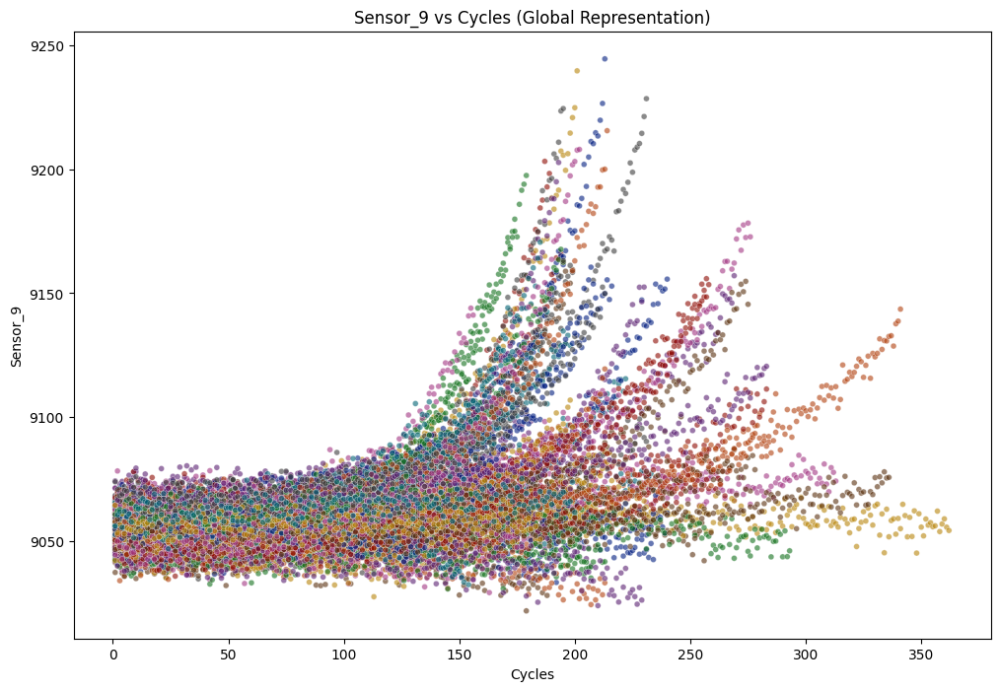

In [48]:
col = 'Sensor_9'
plt.figure(figsize=(12,8))
sns.scatterplot(data=dftrain, x='Cycles', y=col, hue='Engine', palette='dark',alpha=0.6, legend=False, size=12)
plt.title(f'{col} vs Cycles (Global Representation)')
plt.xlabel('Cycles')
plt.ylabel(col)
plt.show()

This subplot function expands on the previous plot to display lifecycle trends for all the *Operational Settings* & *Sensors* globally (across all engines). The function has been used on both the training set and the test set.

In [49]:
def plotSensors (df, title):
    fig, axes = plt.subplots(nrows=6, ncols=4, figsize=(24, 40))
    fig.suptitle(f'Global Engine Readings for Each Sensor ({title})', fontsize=32)
    axes = axes.flatten()

    for i, sensor in enumerate(sensors):
        sns.scatterplot(data=df, x='Cycles', y=sensor, hue='Engine', palette='dark', marker='o', size=12, alpha=0.6, legend=False, ax=axes[i])
        axes[i].set_title(f'Cycles vs {sensor}', fontsize=14)  # Adjust subplot title font size
        axes[i].set_xlabel('Cycles', fontsize=12)
        axes[i].set_ylabel(sensor, fontsize=12)
        
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()

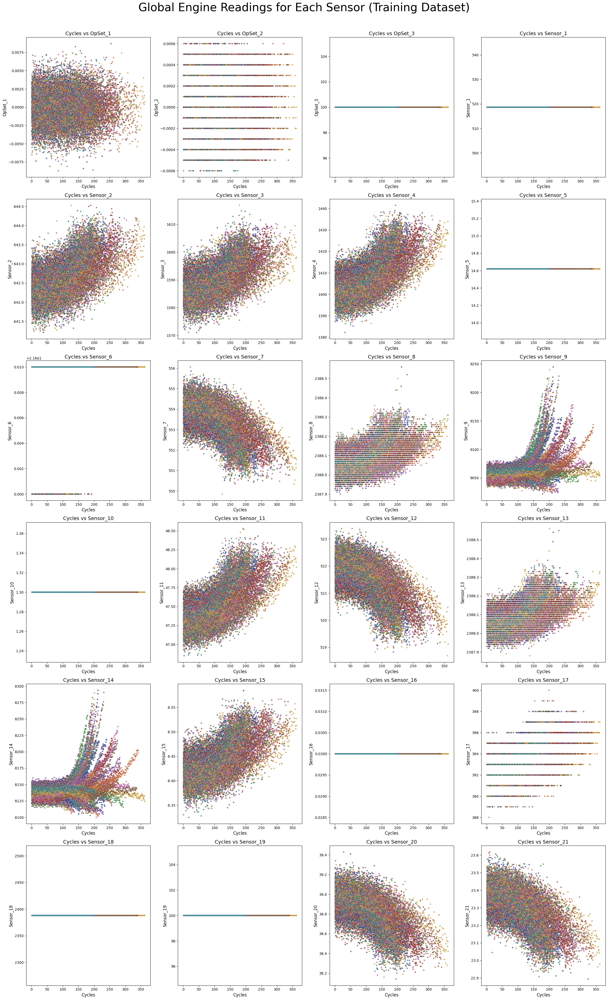

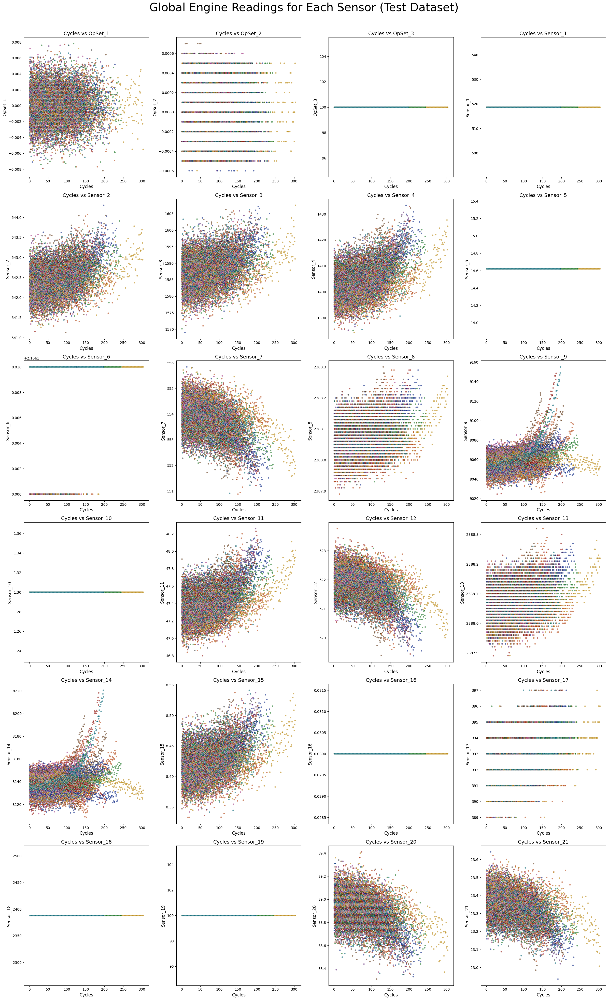

In [50]:
plotSensors(dftrain, title='Training Dataset')
plotSensors(dftest, title='Test Dataset')

From the plot above, we can see that the columns: *OpSet_3, Sensor_1, Sensor_5, Sensor_10, Sensor_16, Sensor_18 & Sensor_19* are all static and thus can be dropped for dimensionality reduction purposes. Sensor_6 on the other hand, has 2 unique values which we need to confirm are valid readings or just anomalies.

In [51]:
#cols = [col for col in dftr.columns if col not in ['Engine', 'Cycles']]
col = 'Sensor_6'

print(dftrain.groupby(col)['Engine'].nunique())
print('')
print(dftest.groupby(col)['Engine'].nunique())

Sensor_6
21.60     62
21.61    100
Name: Engine, dtype: int64

Sensor_6
21.60     66
21.61    100
Name: Engine, dtype: int64


The 2 unique values of Sensor_6 are *21.60* & *21.61* and thus not significantly apart. Therefore, we can treat it as a static column and drop it along with the others.

In [52]:
dftrain.drop(columns=[col for col in dftrain.columns if dftrain[col].nunique() <= 2], inplace=True)
dftest.drop(columns=[col for col in dftest.columns if dftest[col].nunique() <= 2], inplace=True)

The function below is used to plot the histograms for each relevant sensor in order to identify their distribution patterns and skewing which influences the way we go about handing noise/anomalies. The function has also been applied to both the training and test set.

In [53]:
def plotHist (df, title):
    sensors = [col for col in df.columns if col not in ['Engine', 'Cycles']]

    fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(24, 18))
    fig.suptitle(f'Global Engine Histograms for Each Sensor ({title})', fontsize=32)
    axes = axes.flatten()

    for i, sensor in enumerate(sensors):
        sns.histplot(data=df, x=sensor, bins=50, color='seagreen', alpha=0.6, ax=axes[i])
        axes[i].set_title(f'{sensor} Histogram (Global)', fontsize=14)  # Adjust subplot title font size
        axes[i].set_xlabel(sensor, fontsize=12)
        #axes[i].set_ylabel('Count', fontsize=12)
        
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()

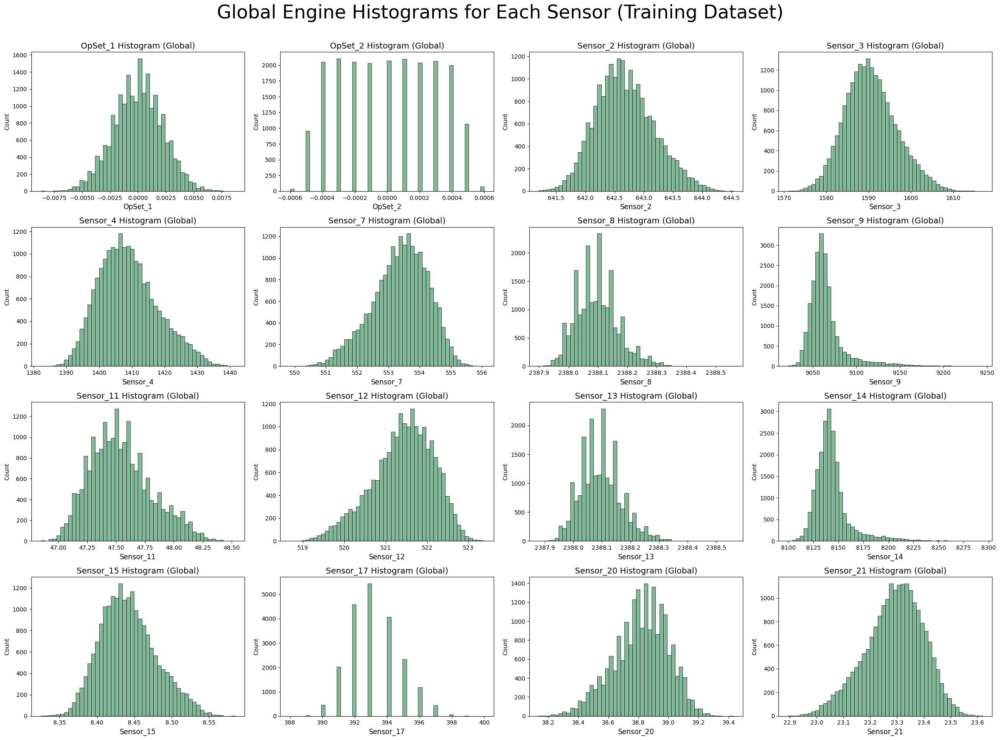

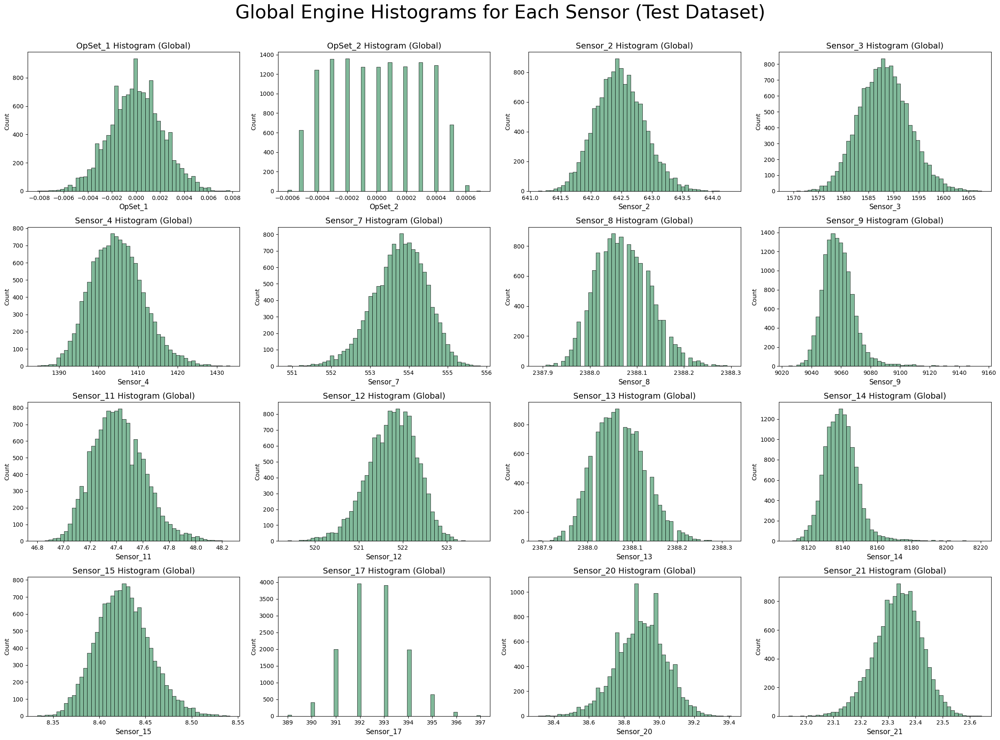

In [54]:
plotHist(dftrain, 'Training Dataset')
plotHist(dftest, 'Test Dataset')

As stated in the description, there is noise present in this data which can interfere with the results. As we have seen with the histograms that many columns are skewed and therefore, identifying anomalies using the zscore or interquartile range method is not ideal. I chose to use a percentile method to identify the anomalies. Here is the methodology behind it:
- From the lifecycle trends plot, we can see that the datapoints follow a polynomial trend of degree 2. So a polynomial line was fitted to the datapoints (y_pred).
- The residuals between the actual values & predicted values (y & y_pred) were calculated.
- Any values that were outside the lower & upper percentile bounds set at 5% & 95% respectively were treated as anomalies.
- The values of these anomalies were then altered to the predicted values from the polynomial regression line at their respective engine cycle.

This is how anomalies were handled in the dataset. Below is a visual demonstration of the methodology followed by a function to handle the anomalies. Please note that the column OpSet_2 was ignored here as it follows a set of discrete values as supposed a regression trend. Its anomalies are handled in a different way.

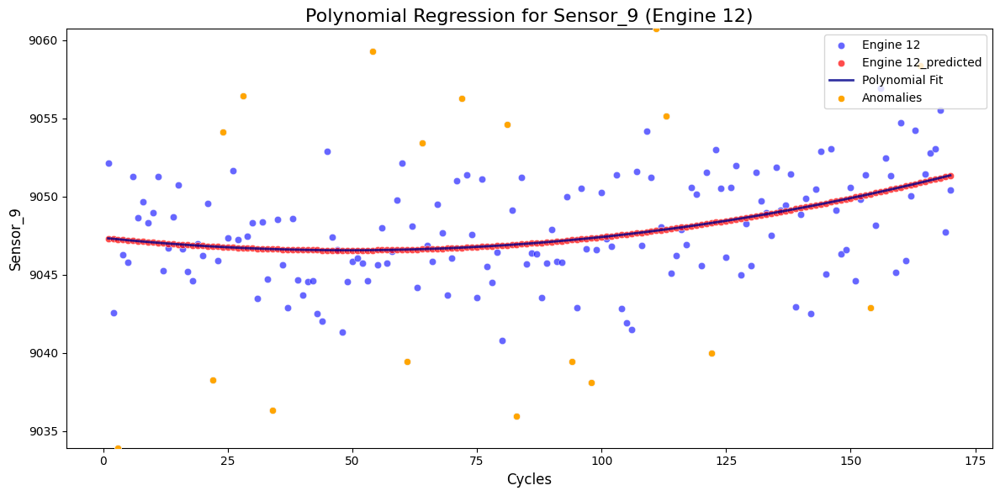

In [55]:
# Specify the engine ID to analyze
engine = 12  # Replace with the desired engine ID
sensor = 'Sensor_9'
poly_degree = 2

# Filter data for the specified engine
df_engine = dftrain.loc[dftrain['Engine'] == engine]

x = df_engine['Cycles']
y = df_engine[sensor]

y_up = y.max()
y_low = y.min()

# Fit polynomial regression
coefficients = np.polyfit(x, y, deg=poly_degree)
poly_func = np.poly1d(coefficients)

# Predict values
y_pred = poly_func(x)

# Calculate residuals (actual - predicted)
residuals = y - y_pred

# Define anomaly threshold (e.g., 2 standard deviations)
lower_b, upper_b = np.percentile(residuals, [5, 95])

# Identify anomalies
anomalies = df_engine[(residuals < lower_b) | (residuals > upper_b)]

# Plot results
plt.figure(figsize=(12, 6))
plt.title(f'Polynomial Regression for {sensor} (Engine {engine})', fontsize=16)
plt.xlabel('Cycles', fontsize=12)
plt.ylabel(sensor, fontsize=12)

# Scatter plot of actual data
sns.scatterplot(x=x, y=y, alpha=0.6, color='blue', label=f'Engine {engine}')
sns.scatterplot(x=x, y=y_pred, alpha=0.7, color='red', label=f'Engine {engine}_predicted')

# Polynomial regression line
x_sorted = np.sort(x)
plt.plot(x_sorted, poly_func(x_sorted), color='darkblue', linewidth=2, alpha=0.8, label='Polynomial Fit')

# Highlight anomalies
sns.scatterplot(data=anomalies, x='Cycles', y=sensor, color='orange', label='Anomalies', zorder=5)

# Add legend and show plot
plt.legend(loc='upper right', fontsize=10)
plt.ylim(y_low,y_up)
plt.tight_layout()
plt.show()

In [56]:
# Function to replace anomalies in the input dataframe using the predicted values from its respective polynomial regression.
def anomaly_replacement_polyfunction(df):

    for engine in df['Engine'].unique():
        
        df_engine = df.loc[df['Engine'] == engine]
        sensors = [col for col in df_engine.columns if col not in ['Engine', 'Cycles', 'OpSet_2']]
        
        for sensor in sensors:
            # Independent and dependent variables
            x = df_engine['Cycles']
            y = df_engine[sensor]
            
            # Fit polynomial regression
            coefficients = np.polyfit(x, y, deg=2)
            poly_func = np.poly1d(coefficients)
            y_pred = poly_func(x)
            
            # Calculate residuals
            residuals = y - y_pred
            
            # Define lower and upper bounds using percentiles
            lower_b, upper_b = np.percentile(residuals, [5, 95])
            
            # Replace anomalies with predicted values
            anomalies_mask = (residuals < lower_b) | (residuals > upper_b)
            df.loc[df_engine.index[anomalies_mask], sensor] = y_pred[anomalies_mask]
    
    return df

In [57]:
dftrain = anomaly_replacement_polyfunction(dftrain)
dftest = anomaly_replacement_polyfunction(dftest)

C:\Users\Shahbaz\AppData\Local\Temp\ipykernel_16512\3151875341.py:27: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[392.10393408 391.88923699 391.87896523 391.87003708 391.88612184
 391.91670604 392.0355255  392.07100703 392.16555383 392.24316433
 392.54794946 392.78210744 393.16636017 393.72146296 394.05464146
 394.17174719 394.75821298 395.07613468 395.12289567 395.5090761 ]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df.loc[df_engine.index[anomalies_mask], sensor] = y_pred[anomalies_mask]
C:\Users\Shahbaz\AppData\Local\Temp\ipykernel_16512\3151875341.py:27: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[391.7205405  391.55697239 391.44615229 391.73740014]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df.loc[df_engine.index[anomali

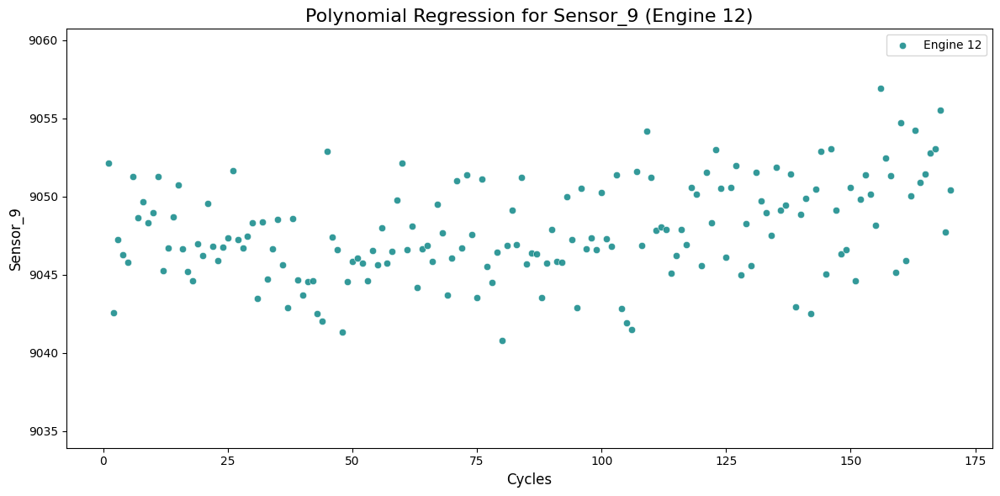

In [58]:
df_engine = dftrain.loc[dftrain['Engine'] == engine]

plt.figure(figsize=(12,6))
sns.scatterplot(data=df_engine, x='Cycles', y=sensor, color='teal', alpha=0.8, label=f'Engine {engine}')
plt.title(f'Polynomial Regression for {sensor} (Engine {engine})', fontsize=16)
plt.xlabel('Cycles', fontsize=12)
plt.ylabel(sensor, fontsize=12)

plt.legend(loc='upper right', fontsize=10)
plt.ylim(y_low, y_up)
plt.tight_layout()
plt.show()

Here is how the anomalies of OpSet_2 are handled.

In [59]:
print((dftrain['OpSet_2'].value_counts().sort_index()))

OpSet_2
-0.0006      34
-0.0005     958
-0.0004    2051
-0.0003    2104
-0.0002    2049
-0.0001    2029
 0.0000    2070
 0.0001    2097
 0.0002    2038
 0.0003    2065
 0.0004    1997
 0.0005    1068
 0.0006      71
Name: count, dtype: int64


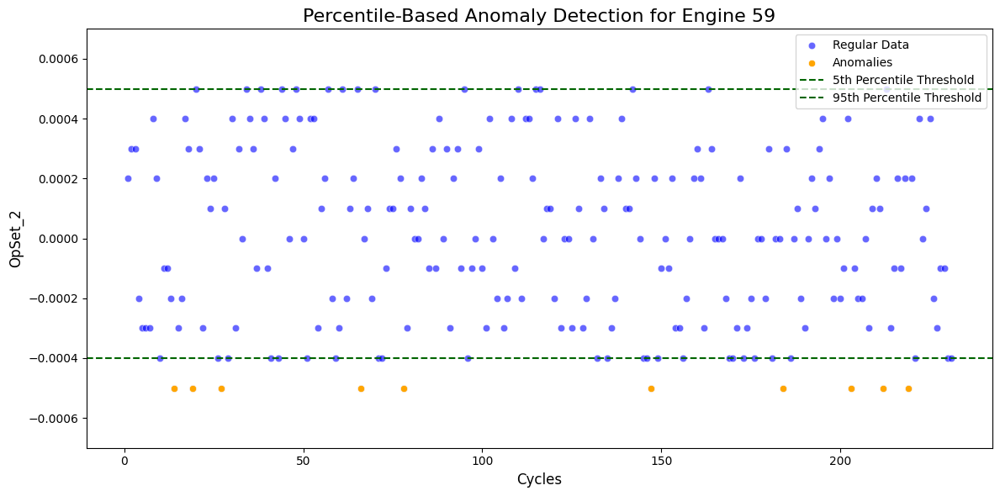

In [60]:
engine = 59
df_engine = dftrain.loc[dftrain['Engine'] == engine]

lower_bound, upper_bound = np.percentile(df_engine['OpSet_2'], [5, 95])
anomalies = df_engine[(df_engine['OpSet_2'] < lower_bound) | (df_engine['OpSet_2'] > upper_bound)]

plt.figure(figsize=(12, 6))
plt.title(f'Percentile-Based Anomaly Detection for Engine {engine}', fontsize=16)
plt.xlabel('Cycles', fontsize=12)
plt.ylabel('OpSet_2', fontsize=12)
plt.ylim(-0.0007,0.0007)

sns.scatterplot(data=df_engine, x='Cycles', y='OpSet_2', color='blue', alpha=0.6, label='Regular Data')
sns.scatterplot(data=anomalies, x='Cycles', y='OpSet_2', color='orange', label='Anomalies', zorder=5)
plt.axhline(lower_bound, color='darkgreen', linestyle='--', label='5th Percentile Threshold')
plt.axhline(upper_bound, color='darkgreen', linestyle='--', label='95th Percentile Threshold')

plt.legend(loc='upper right', fontsize=10)
plt.tight_layout()
plt.show()

In [61]:
def anomaly_replacement_bounds(df):
    
    for engine in df['Engine'].unique():
        # Filter data for the current engine
        df_engine = df.loc[df['Engine'] == engine]
        
        # Compute the percentile boundaries
        y = df_engine['OpSet_2']
        lower_b, upper_b = np.percentile(y, [5, 95])
        
        # Identify and replace anomalies
        df.loc[df_engine.index, 'OpSet_2'] = np.where(y < lower_b, lower_b, np.where(y > upper_b, upper_b, y))
    
    return df

In [62]:
dftrain = anomaly_replacement_bounds(dftrain)
dftest = anomaly_replacement_bounds(dftest)

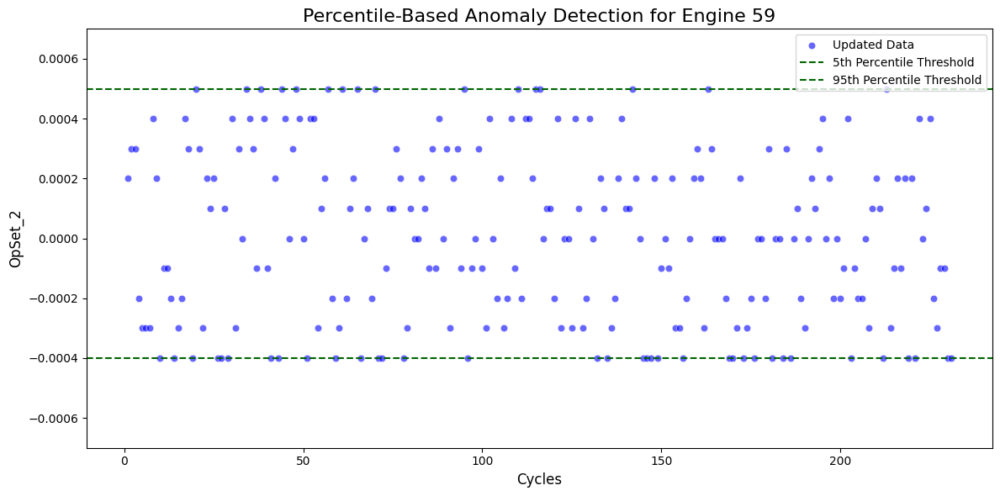

In [63]:
engine = 59
df_engine = dftrain.loc[dftrain['Engine'] == engine]

plt.figure(figsize=(12, 6))
plt.title(f'Percentile-Based Anomaly Detection for Engine {engine}', fontsize=16)
plt.xlabel('Cycles', fontsize=12)
plt.ylabel('OpSet_2', fontsize=12)
plt.ylim(-0.0007,0.0007)

sns.scatterplot(data=df_engine, x='Cycles', y='OpSet_2', color='blue', alpha=0.6, label='Updated Data')
plt.axhline(lower_bound, color='darkgreen', linestyle='--', label='5th Percentile Threshold')
plt.axhline(upper_bound, color='darkgreen', linestyle='--', label='95th Percentile Threshold')

plt.legend(loc='upper right', fontsize=10)
plt.tight_layout()
plt.show()

Calculate the RULs for each engine.

In [64]:
cycles_max = dftrain.groupby(['Engine'], as_index=False)['Cycles'].max()

for engine in cycles_max['Engine']:
    dftrain.loc[dftrain['Engine'] == engine, 'RUL'] = cycles_max.loc[cycles_max['Engine'] == engine, 'Cycles'].values[0] - dftrain.loc[dftrain['Engine'] == engine, 'Cycles']

dftrain['RUL'] = dftrain['RUL'].astype('int64')

Introduce Time Series Features:

The function below is calculate the moving averages of each operational Setting & Sensor column. The rolling window = 5

In [65]:
def moving_avgs (df, ws=5):
    sensors = [col for col in df.columns if col.startswith('OpSet_') or col.startswith('Sensor_')]

    for engine in df['Engine'].unique():
        df_engine = df.loc[df['Engine'] == engine]
        
        for sensor in sensors:
            col_name = f'MA_{sensor}'
            df.loc[df['Engine'] == engine, col_name] = df_engine[sensor].rolling(window=ws).mean()
            df.loc[df['Engine'] == engine, col_name] = df.loc[df['Engine'] == engine, col_name].bfill()
    
    return df            

The following function is to calculate the consecutive difference between the relevant columns.

In [66]:
def consecutive_diff (df): 
    sensors = [col for col in df.columns if col.startswith('OpSet_') or col.startswith('Sensor_')]
    
    for engine in df['Engine'].unique():
        df_engine = df.loc[df['Engine'] == engine]
        
        for sensor in sensors:
            col_name = f'Diff_{sensor}'
            df.loc[df['Engine'] == engine, col_name] = df_engine[sensor].diff()  
            df[col_name] = df[col_name].fillna(0)
    
    return df

Scale the columns using MinMax Scaling.

In [67]:
def scale (df, standard):
    cols = [col for col in df.columns if col not in ['Engine', 'Cycles', 'RUL']]
    
    if standard == True:
        scaler = StandardScaler()
    else:
        scaler = MinMaxScaler(feature_range=(0,1))
        
    df[cols] = scaler.fit_transform(df[cols])
    
    return df

Create a Pipeline to apply the relevent time-series & preprocessing functions using *FunctionTransformer*.

In [68]:
# Regular Version Pipeline
pipe_regular = Pipeline(
    steps=[
        ('Moving_Averages', FunctionTransformer(moving_avgs, kw_args={'ws':5})),
        ('Consecutive_Differences', FunctionTransformer(consecutive_diff)),
        ('Scaling', FunctionTransformer(scale, kw_args={'standard':False})),
        ('OH_Encoding', FunctionTransformer(pd.get_dummies, kw_args={'columns': ['Engine'], 'drop_first': False, 'dtype': int})),
        ('Regressor', RandomForestRegressor(random_state=None, n_estimators=300, min_samples_split=10, min_samples_leaf=1, max_features='sqrt', max_depth=None))
    ]
)

Create the train set and test set. Please note that there is no issue of data leaking here since we have not split the training set into a train and test set since we already have a separate training set and separate test set provided by the developers.

In [69]:
x_train = dftrain.drop(columns=['RUL'])
y_train = dftrain['RUL']
x_test = dftest.copy()

The code below is to identify the best parameters and perform cross validation. Since there are a lot of parameters and each parameter setting goes through 5 cross validation runs, the computing time compounds a lot. Therefore run it however you see convenient.

In [70]:
'''
group_kfold = GroupKFold(n_splits=5)

parameters = {
    'Regressor__n_estimators':[100,200,300,400,500],
    'Regressor__max_depth': [None, 10, 12, 15, 20, 25, 30],
    'Regressor__min_samples_split': [2, 3, 4, 5, 10],
    'Regressor__min_samples_leaf': [1, 2, 3, 4, 5],
    'Regressor__max_features': ['sqrt']
}

gridSearch = GridSearchCV(
    pipe_regular,
    parameters,
    cv=group_kfold,
    scoring='neg_mean_squared_error',
    verbose=2,
    n_jobs=-1
)

gridSearch.fit(x_train, y_train, groups=dftrain.copy()['Engine'])
print('Best Parameters:', gridSearch.best_params_)
print('Best Score: (MSE)', -gridSearch.best_score_)
'''

"\ngroup_kfold = GroupKFold(n_splits=5)\n\nparameters = {\n    'Regressor__n_estimators':[100,200,300,400,500],\n    'Regressor__max_depth': [None, 10, 12, 15, 20, 25, 30],\n    'Regressor__min_samples_split': [2, 3, 4, 5, 10],\n    'Regressor__min_samples_leaf': [1, 2, 3, 4, 5],\n    'Regressor__max_features': ['sqrt']\n}\n\ngridSearch = GridSearchCV(\n    pipe_regular,\n    parameters,\n    cv=group_kfold,\n    scoring='neg_mean_squared_error',\n    verbose=2,\n    n_jobs=-1\n)\n\ngridSearch.fit(x_train, y_train, groups=dftrain.copy()['Engine'])\nprint('Best Parameters:', gridSearch.best_params_)\nprint('Best Score: (MSE)', -gridSearch.best_score_)\n"

In [71]:
pipe_regular.fit(x_train, y_train)
RULs_regular = pipe_regular.predict(x_test).round().astype(int)

The predicted RUL values are calculated and the final RUL value for each engine is extracted indicating the predicted RUL value.

In [72]:
dfEngine = dftest.loc[:,['Engine']]
dfEngine['RUL'] = RULs_regular

df_rul = dfEngine.groupby(['Engine'], as_index=False)[['RUL']].last()
df_rul = df_rul.sort_values(by='Engine').reset_index(drop=True)

df_rul

,Engine,RUL
0,1,160
1,2,139
2,3,41
3,4,63
4,5,81
...,...,...
95,96,124
96,97,67
97,98,56
98,99,109


The predicted RUL values for each engine are compared against their actual RUL values from the dfr dataset. The results are also plotted below. The blue graphs indicate the actual RUL values while the orange represent the predicted RUL values.

In [73]:
rul_pred = df_rul['RUL'].values
rul_true = dfr['RUL'].values

mse = mean_squared_error(rul_true, rul_pred)
rmse = root_mean_squared_error(rul_true, rul_pred)
mae = mean_absolute_error(rul_true, rul_pred)
mape = mean_absolute_percentage_error(rul_true, rul_pred)
r2 = r2_score(rul_true, rul_pred)

print('--'*10 + ' RandomForest Regressor ' + '--'*10 + '\n')
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"Mean Absolute Error (MAE): {mae}")
print(f'Mean Absolute Percentage Error (MAPE): {mape}')
print(f"R^2 Score: {r2}")

-------------------- RandomForest Regressor --------------------

Mean Squared Error (MSE): 661.31
Root Mean Squared Error (RMSE): 25.715948358946438
Mean Absolute Error (MAE): 19.41
Mean Absolute Percentage Error (MAPE): 0.3117186376960394
R^2 Score: 0.6170469385760221


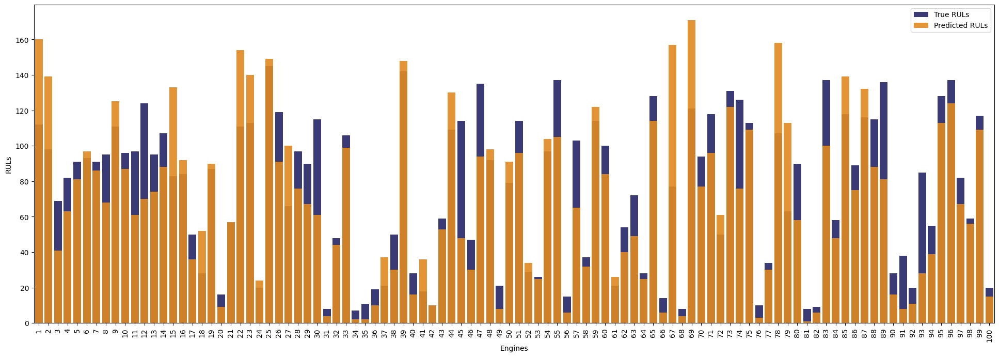

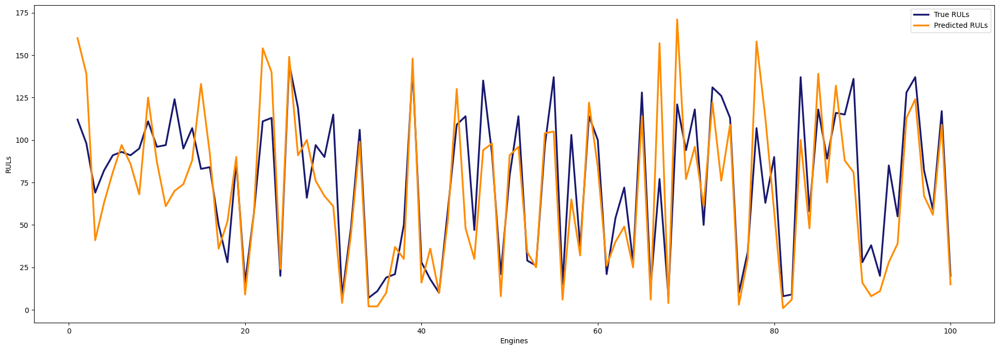

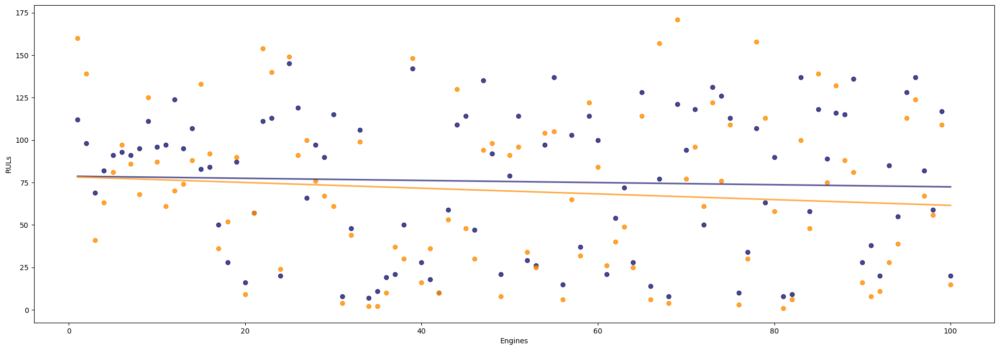

In [74]:
eng_values = df_rul['Engine'].values

plt.figure(figsize=(24,8))
sns.barplot(x=eng_values, y=rul_true, color='midnightblue', alpha=0.9, label='True RULs')  
sns.barplot(x=eng_values, y=rul_pred, color='darkorange', alpha=0.9, label='Predicted RULs')  
plt.xlabel('Engines')
plt.xticks(rotation=90)
plt.ylabel('RULs')
plt.show()

plt.figure(figsize=(24,8))
sns.lineplot(x=eng_values, y=rul_true, color='midnightblue', label='True RULs', linewidth=2.5)
sns.lineplot(x=eng_values, y=rul_pred, color='darkorange', label='Predicted RULs', linewidth=2.5)
plt.xlabel('Engines')
plt.ylabel('RULs')
plt.show()

plt.figure(figsize=(24,8))
sns.regplot(x=eng_values, y=rul_true, scatter_kws={'color': 'midnightblue', 'label': 'True RULs'}, line_kws={'color': 'midnightblue', 'alpha': 0.7}, ci=None)
sns.regplot(x=eng_values, y=rul_pred, scatter_kws={'color': 'darkorange', 'label': 'Predicted RULs'}, line_kws={'color': 'darkorange', 'alpha': 0.7}, ci=None)
plt.xlabel('Engines')
plt.ylabel('RULs')
plt.show()